<a href="https://colab.research.google.com/github/Benbuk/GOMYCODE_DS_Bootcamp/blob/main/Streamlit1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

What You're Aiming For

In this checkpoint, we are going to work on the 'Expresso churn' dataset that was provided as part of Expresso Churn Prediction Challenge hosted by Zindi platform.

Dataset description: Expresso is an African telecommunications services company that provides telecommunication services in two African markets: Mauritania and Senegal. The data describes 2.5 million Expresso clients with more than 15 behaviour variables in order to predict the clients' churn probability.

➡️ [Data link](https://https://drive.google.com/file/d/12_KUHr5NlHO_6bN5SylpkxWc-JvpJNWe/view)

➡️ Columns explanation


Follow These Steps
1. Install the necessary packages
2. Import you data and perform basic data exploration phase
>* Display general information about the dataset
>* Create a pandas profiling reports to gain insights into the dataset
>* Handle Missing and corrupted values
>* Remove duplicates, if they exist
>* Handle outliers, if they exist
>* Encode categorical features
3. Based on the previous data exploration train and test a machine learning classifier
4. Create a streamlit application (locally)
5. Add input fields for your features and a validation button at the end of the form
6. Import your ML model into the streamlit application and start making predictions given the provided features values

Note:

This checkpoint should be done locally, (Google colab notebooks won't work)
Make sure to run the app using the "streamlit run" command in your terminal.

In [ ]:
#Install neccessary Libraries
!pip install Ydata_profiling
from ydata_profiling import ProfileReport

import pandas as pd

In [ ]:
#importing the dataset
data = pd.read_csv("/content/Expresso_churn_dataset.csv")

print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679967 entries, 0 to 679966
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   user_id         679967 non-null  object 
 1   REGION          411707 non-null  object 
 2   TENURE          679966 non-null  object 
 3   MONTANT         441285 non-null  float64
 4   FREQUENCE_RECH  441285 non-null  float64
 5   REVENUE         450922 non-null  float64
 6   ARPU_SEGMENT    450922 non-null  float64
 7   FREQUENCE       450922 non-null  float64
 8   DATA_VOLUME     345451 non-null  float64
 9   ON_NET          431852 non-null  float64
 10  ORANGE          397376 non-null  float64
 11  TIGO            273004 non-null  float64
 12  ZONE1           53691 non-null   float64
 13  ZONE2           43185 non-null   float64
 14  MRG             679966 non-null  object 
 15  REGULARITY      679966 non-null  float64
 16  TOP_PACK        395423 non-null  object 
 17  FREQ_TOP_P

In [ ]:
#summary of the dataset
data.head()

,user_id,REGION,TENURE,MONTANT,FREQUENCE_RECH,REVENUE,ARPU_SEGMENT,FREQUENCE,DATA_VOLUME,ON_NET,ORANGE,TIGO,ZONE1,ZONE2,MRG,REGULARITY,TOP_PACK,FREQ_TOP_PACK,CHURN
0,00000bfd7d50f01092811bc0c8d7b0d6fe7c3596,FATICK,K > 24 month,4250.0,15.0,4251.0,1417.0,17.0,4.0,388.0,46.0,1.0,1.0,2.0,NO,54.0,On net 200F=Unlimited _call24H,8.0,0.0
1,00000cb4a5d760de88fecb38e2f71b7bec52e834,NaN,I 18-21 month,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO,4.0,NaN,NaN,1.0
2,00001654a9d9f96303d9969d0a4a851714a4bb57,NaN,K > 24 month,3600.0,2.0,1020.0,340.0,2.0,NaN,90.0,46.0,7.0,NaN,NaN,NO,17.0,On-net 1000F=10MilF;10d,1.0,0.0
3,00001dd6fa45f7ba044bd5d84937be464ce78ac2,DAKAR,K > 24 month,13500.0,15.0,13502.0,4501.0,18.0,43804.0,41.0,102.0,2.0,NaN,NaN,NO,62.0,"Data:1000F=5GB,7d",11.0,0.0
4,000028d9e13a595abe061f9b58f3d76ab907850f,DAKAR,K > 24 month,1000.0,1.0,985.0,328.0,1.0,NaN,39.0,24.0,NaN,NaN,NaN,NO,11.0,Mixt 250F=Unlimited_call24H,2.0,0.0


In [ ]:
data_profile = ProfileReport(data, title ="Data Profiling")

data_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#removed all duplicated cell
data.duplicated().sum()

0

In [ ]:
#Checking null values
data.isnull().sum()

user_id                0
REGION            268260
TENURE                 1
MONTANT           238682
FREQUENCE_RECH    238682
REVENUE           229045
ARPU_SEGMENT      229045
FREQUENCE         229045
DATA_VOLUME       334516
ON_NET            248115
ORANGE            282591
TIGO              406963
ZONE1             626276
ZONE2             636782
MRG                    1
REGULARITY             1
TOP_PACK          284544
FREQ_TOP_PACK     284544
CHURN                  1
dtype: int64

>* Dropped the user_id
>* Over 50% of the 'ZONE1', 'ZONE2', 'TIGO', 'DATA_VOLUME' columns contained null data so these columns were dorpped. Also, user_id was also dropped.

In [ ]:
data.drop(['ZONE1', 'ZONE2','user_id', 'TIGO', 'DATA_VOLUME'], axis = 1, inplace = True )

>* Drop the missing value in REGION rowwise since the values cannot be filled numerically.

In [ ]:
data.dropna(subset=['REGION'], inplace = True)

>* Filled out the missing values with mean

In [ ]:
# Transform 'counter_type' feature to a numeric variable using LabelEncoder
from sklearn.preprocessing import LabelEncoder
data['REGION'] = LabelEncoder().fit_transform(data['REGION'])
data['TENURE'] = LabelEncoder().fit_transform(data['TENURE'])
data['MONTANT'] = LabelEncoder().fit_transform(data['MONTANT'])
data['MRG'] = LabelEncoder().fit_transform(data['MRG'])
data['TOP_PACK'] = LabelEncoder().fit_transform(data['TOP_PACK'])

In [ ]:
#filling missing data with mean
data_filled = data.fillna(data.mean(), inplace=True)

In [ ]:
data.head()

,REGION,TENURE,MONTANT,FREQUENCE_RECH,REVENUE,ARPU_SEGMENT,FREQUENCE,ON_NET,ORANGE,MRG,REGULARITY,TOP_PACK,FREQ_TOP_PACK,CHURN
0,2,7,423,15.000000,4251.000000,1417.000000,17.000000,388.000000,46.000000,0,54.0,82,8.000000,0.0
3,0,7,1462,15.000000,13502.000000,4501.000000,18.000000,41.000000,102.000000,0,62.0,28,11.000000,0.0
4,0,7,75,1.000000,985.000000,328.000000,1.000000,39.000000,24.000000,0,11.0,77,2.000000,0.0
5,7,7,967,17.000000,9000.000000,3000.000000,18.000000,252.000000,70.000000,0,62.0,74,18.000000,0.0
6,7,7,3055,12.624453,6107.097318,2035.704677,15.369538,313.839578,105.563937,0,2.0,106,9.988546,0.0


In [ ]:
data.isnull().sum()

REGION            0
TENURE            0
MONTANT           0
FREQUENCE_RECH    0
REVENUE           0
ARPU_SEGMENT      0
FREQUENCE         0
ON_NET            0
ORANGE            0
MRG               0
REGULARITY        0
TOP_PACK          0
FREQ_TOP_PACK     0
CHURN             0
dtype: int64

In [ ]:
#dropping null values
data = data.dropna(axis = 0, how = 'any')

In [ ]:
data.shape

(411707, 14)

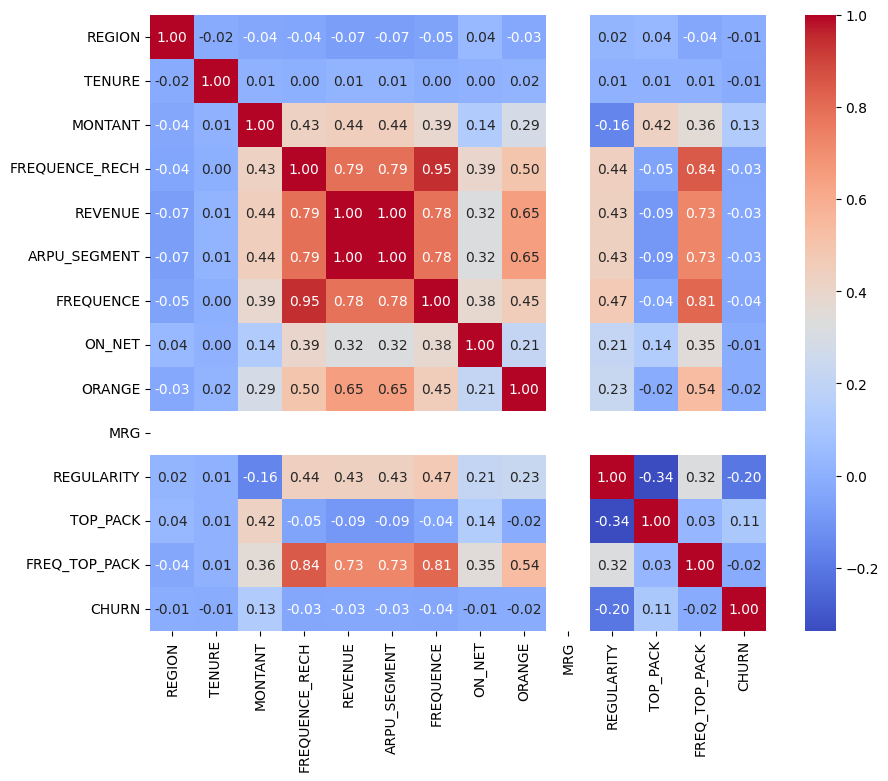

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr = data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))  # You can adjust the size of the figure
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)

plt.show()

In [ ]:
#removing outliers in the data
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1
outliers_lower = (data < lower_bound)
outliers_upper = (data > upper_bound)
data_no_outliers = data[~(outliers_lower | outliers_upper).any(axis=1)]

NameError: name 'lower_bound' is not defined

In [ ]:
# Define features (x) and target variable(y)
X = data.drop('HasDetections', axis = 1)
y = data['HasDetections']


#Split the dataset into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

#create and train the Decision Tree model
data_model = DecisionTreeClassifier()
data_model.fit(X_train, y_train)

#Predict probabilities for the positive class
y_probs = data_model.predict_proba(X_test)[:,1]


#compute ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree')
plt.legend(loc='lower right')
plt.show()